# Vanilla GAN

# Packages 

In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from PIL import Image
import time
import glob
import imageio
from IPython import display
import cv2
import pathlib
import zipfile
import torch
import sys
import pandas as pd 

import torchvision
import torch.nn as nn
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader, ConcatDataset, TensorDataset
from torchvision.utils import make_grid
import torch.optim as optim
from torchvision.datasets import MNIST

from skimage import io, transform

!pip install torchsummary
from torchsummary import summary

!pip install torchviz
from torchviz import make_dot, make_dot_from_trace

You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.
     |████████████████████████████████| 41 kB 141 kB/s eta 0:00:01
  Created wheel for torchviz: filename=torchviz-0.0.1-py3-none-any.whl size=3521 sha256=6013195fe7c644a8a9e2ed7a8e753be85b45c38ae3f0f9d667ea0d12e8db2261
  Stored in directory: /root/.cache/pip/wheels/10/7b/c8/3af79ec02e294a832c01037bcb38302bbcee0bb020dcbbbd3e
Successfully built torchviz
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


# Device Mode

In [2]:
# Decide which device we want to run on
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
device

device(type='cpu')

# Generator

In [3]:
class Generator(nn.Module):

    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()

        self.gen = nn.Sequential(
            self.get_generator_block(z_dim, hidden_dim),
            self.get_generator_block(hidden_dim, hidden_dim * 2),
            self.get_generator_block(hidden_dim * 2, hidden_dim * 4),
            self.get_generator_block(hidden_dim * 4, hidden_dim * 8),

            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()

        )
    def get_generator_block(self, input_dim, output_dim):
        return nn.Sequential(
            nn.Linear(input_dim, output_dim),
            nn.BatchNorm1d(output_dim),
            nn.ReLU(inplace=True),
        )
    
    def forward(self, noise):
        return self.gen(noise)
    
summary(Generator(64).to(device) , (64,))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [-1, 128]           8,320
       BatchNorm1d-2                  [-1, 128]             256
              ReLU-3                  [-1, 128]               0
            Linear-4                  [-1, 256]          33,024
       BatchNorm1d-5                  [-1, 256]             512
              ReLU-6                  [-1, 256]               0
            Linear-7                  [-1, 512]         131,584
       BatchNorm1d-8                  [-1, 512]           1,024
              ReLU-9                  [-1, 512]               0
           Linear-10                 [-1, 1024]         525,312
      BatchNorm1d-11                 [-1, 1024]           2,048
             ReLU-12                 [-1, 1024]               0
           Linear-13                  [-1, 784]         803,600
          Sigmoid-14                  [

# Discriminator

In [4]:
class Discriminator(nn.Module):

    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            self.get_discriminator_block(im_dim, hidden_dim * 4),
            self.get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            self.get_discriminator_block(hidden_dim * 2, hidden_dim),

            nn.Linear(hidden_dim, 1)

        )
    def get_discriminator_block(self, input_dim, output_dim):
        return nn.Sequential(
             nn.Linear(input_dim, output_dim), 
             nn.LeakyReLU(0.2, inplace=True)
        )
    def forward(self, image):
        return self.disc(image)
    
summary(Discriminator().to(device) , (28*28,))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [-1, 512]         401,920
         LeakyReLU-2                  [-1, 512]               0
            Linear-3                  [-1, 256]         131,328
         LeakyReLU-4                  [-1, 256]               0
            Linear-5                  [-1, 128]          32,896
         LeakyReLU-6                  [-1, 128]               0
            Linear-7                    [-1, 1]             129
Total params: 566,273
Trainable params: 566,273
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.01
Params size (MB): 2.16
Estimated Total Size (MB): 2.18
----------------------------------------------------------------


# Noise Create Function

In [5]:
def get_noise(n_samples, z_dim, device='cpu'):
    return torch.randn(n_samples,z_dim,device=device)

# MNIST Dataset Load

In [6]:
z_dim = 64
batch_size = 128

fixed_noise = get_noise(batch_size, z_dim, device=device)

train_transform = transforms.Compose([
    transforms.ToTensor(),
])

dataloader = DataLoader(
    MNIST('.', download=True, transform=train_transform),
    batch_size=batch_size,
    shuffle=True)

|          | 0/? [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw


|          | 0/? [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw


|          | 0/? [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw


|          | 0/? [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw
Processing...
Done!


/opt/conda/lib/python3.7/site-packages/torchvision/datasets/mnist.py:480: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /opt/conda/conda-bld/pytorch_1603729141890/work/torch/csrc/utils/tensor_numpy.cpp:141.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


# Loaded Data Visualization

Time is 0.03126049041748047 sec
Shape of loading one batch: torch.Size([128, 1, 28, 28])
Total no. of batches present in trainloader: 469


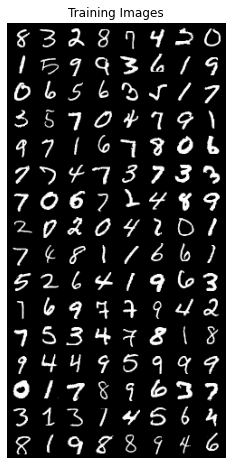

In [7]:
start = time.time()
dataiter = iter(dataloader)
images,labels = dataiter.next()
print ('Time is {} sec'.format(time.time()-start))

plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(make_grid(images.to(device), padding=2, normalize=True).cpu(),(1,2,0)))

print('Shape of loading one batch:', images.shape)
print('Total no. of batches present in trainloader:', len(dataloader))

# Loss Function & Optimizer

In [8]:
lr = 0.00001

criterion = nn.BCEWithLogitsLoss()

gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)

disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

# Model Training

In [9]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28), show_fig=False, epoch=0):
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.axis('off')
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    if show_fig:
        plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
        
    plt.show()

Epoch: 0/200 Steps:469	Epoch_Run_Time: 35.925621	Loss_D : 0.328751	Loss_G : 1.777505	


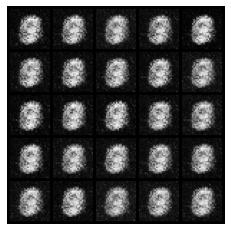

Epoch: 1/200 Steps:469	Epoch_Run_Time: 36.348396	Loss_D : 0.187193	Loss_G : 1.945109	


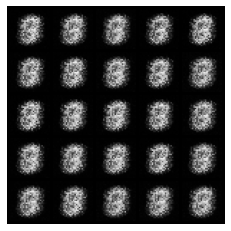

Epoch: 2/200 Steps:469	Epoch_Run_Time: 35.962125	Loss_D : 0.143651	Loss_G : 2.278986	


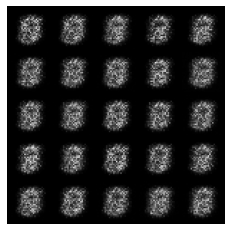

Epoch: 3/200 Steps:469	Epoch_Run_Time: 36.388310	Loss_D : 0.207219	Loss_G : 1.825532	


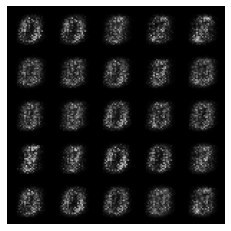

Epoch: 4/200 Steps:469	Epoch_Run_Time: 36.070843	Loss_D : 0.213980	Loss_G : 1.735594	


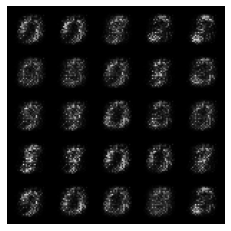

Epoch: 5/200 Steps:469	Epoch_Run_Time: 36.121022	Loss_D : 0.122322	Loss_G : 2.120088	


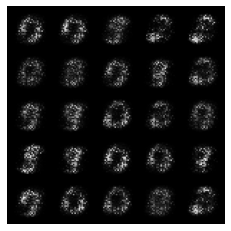

Epoch: 6/200 Steps:469	Epoch_Run_Time: 36.298835	Loss_D : 0.098751	Loss_G : 2.606701	


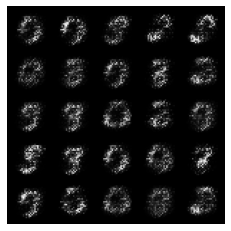

Epoch: 7/200 Steps:469	Epoch_Run_Time: 36.570876	Loss_D : 0.122671	Loss_G : 2.674658	


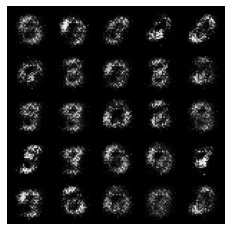

Epoch: 8/200 Steps:469	Epoch_Run_Time: 37.130919	Loss_D : 0.127741	Loss_G : 2.698710	


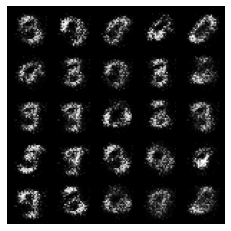

Epoch: 9/200 Steps:469	Epoch_Run_Time: 36.983173	Loss_D : 0.090027	Loss_G : 3.148274	


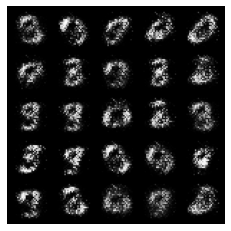

Epoch: 10/200 Steps:469	Epoch_Run_Time: 36.867820	Loss_D : 0.066321	Loss_G : 3.507659	


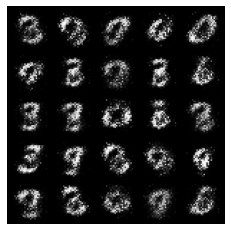

Epoch: 11/200 Steps:469	Epoch_Run_Time: 36.898822	Loss_D : 0.046299	Loss_G : 3.434922	


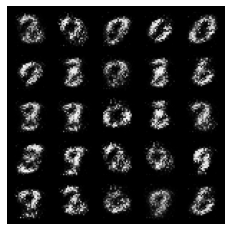

Epoch: 12/200 Steps:469	Epoch_Run_Time: 36.799402	Loss_D : 0.053270	Loss_G : 3.720292	


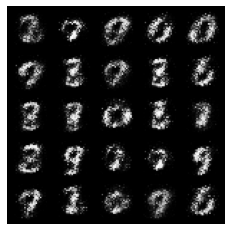

Epoch: 13/200 Steps:469	Epoch_Run_Time: 36.726419	Loss_D : 0.074574	Loss_G : 3.911644	


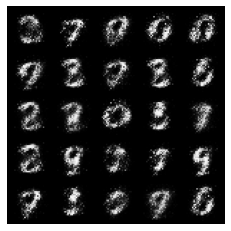

Epoch: 14/200 Steps:469	Epoch_Run_Time: 36.777290	Loss_D : 0.049371	Loss_G : 3.595476	


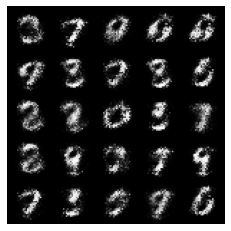

Epoch: 15/200 Steps:469	Epoch_Run_Time: 37.161515	Loss_D : 0.056051	Loss_G : 4.121604	


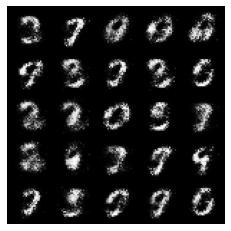

Epoch: 16/200 Steps:469	Epoch_Run_Time: 37.116758	Loss_D : 0.071956	Loss_G : 3.737510	


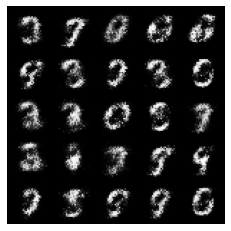

Epoch: 17/200 Steps:469	Epoch_Run_Time: 36.791065	Loss_D : 0.075626	Loss_G : 3.665853	


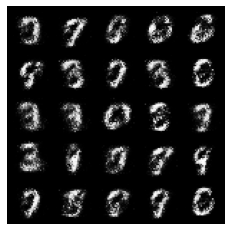

Epoch: 18/200 Steps:469	Epoch_Run_Time: 36.834754	Loss_D : 0.119397	Loss_G : 3.721620	


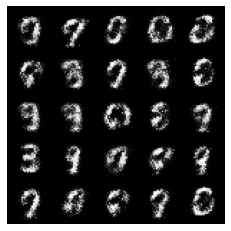

Epoch: 19/200 Steps:469	Epoch_Run_Time: 36.711903	Loss_D : 0.081392	Loss_G : 4.646433	


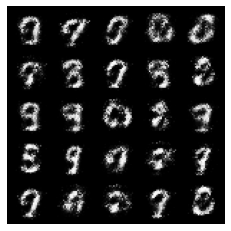

Epoch: 20/200 Steps:469	Epoch_Run_Time: 36.730203	Loss_D : 0.066033	Loss_G : 4.073578	


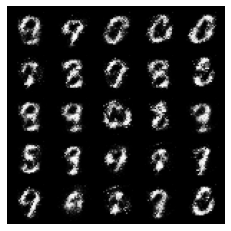

Epoch: 21/200 Steps:469	Epoch_Run_Time: 37.062667	Loss_D : 0.072044	Loss_G : 4.283278	


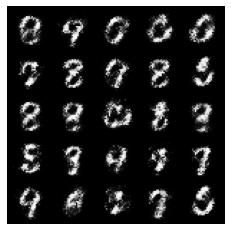

Epoch: 22/200 Steps:469	Epoch_Run_Time: 36.839363	Loss_D : 0.079621	Loss_G : 4.132901	


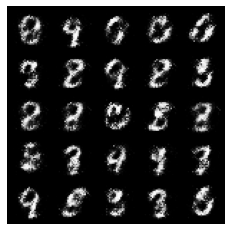

Epoch: 23/200 Steps:469	Epoch_Run_Time: 37.262634	Loss_D : 0.079067	Loss_G : 4.102560	


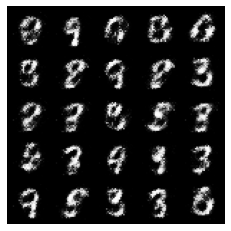

Epoch: 24/200 Steps:469	Epoch_Run_Time: 37.005200	Loss_D : 0.078393	Loss_G : 4.545250	


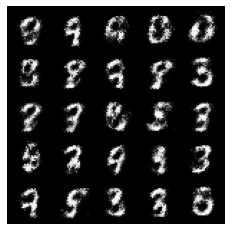

Epoch: 25/200 Steps:469	Epoch_Run_Time: 36.810253	Loss_D : 0.107941	Loss_G : 3.879327	


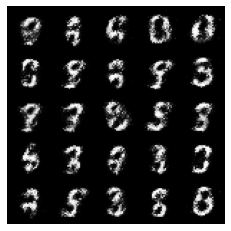

Epoch: 26/200 Steps:469	Epoch_Run_Time: 36.413256	Loss_D : 0.060516	Loss_G : 3.834978	


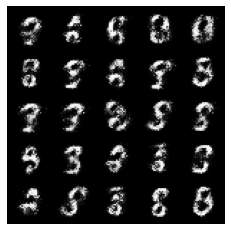

Epoch: 27/200 Steps:469	Epoch_Run_Time: 35.969058	Loss_D : 0.052810	Loss_G : 3.871798	


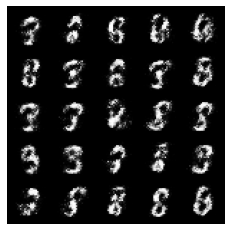

Epoch: 28/200 Steps:469	Epoch_Run_Time: 36.115188	Loss_D : 0.119971	Loss_G : 3.816184	


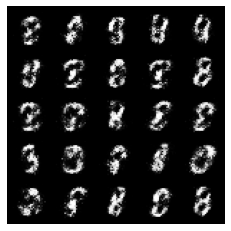

Epoch: 29/200 Steps:469	Epoch_Run_Time: 36.482851	Loss_D : 0.079350	Loss_G : 3.606062	


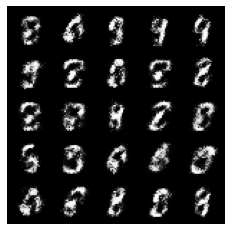

Epoch: 30/200 Steps:469	Epoch_Run_Time: 36.937379	Loss_D : 0.059719	Loss_G : 3.879443	


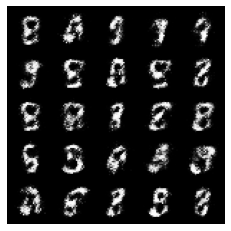

Epoch: 31/200 Steps:469	Epoch_Run_Time: 36.885184	Loss_D : 0.055707	Loss_G : 3.937484	


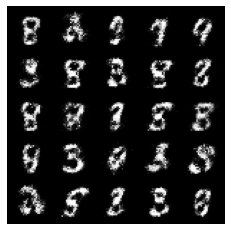

Epoch: 32/200 Steps:469	Epoch_Run_Time: 36.900465	Loss_D : 0.049931	Loss_G : 4.164834	


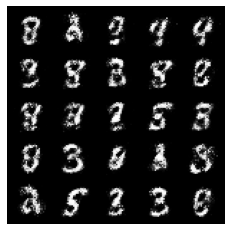

Epoch: 33/200 Steps:469	Epoch_Run_Time: 37.006599	Loss_D : 0.068160	Loss_G : 3.438960	


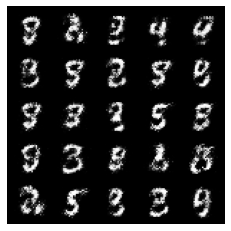

Epoch: 34/200 Steps:469	Epoch_Run_Time: 36.698646	Loss_D : 0.101364	Loss_G : 3.545778	


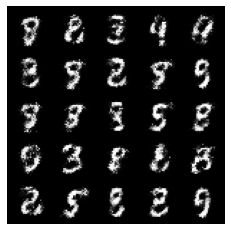

Epoch: 35/200 Steps:469	Epoch_Run_Time: 37.109935	Loss_D : 0.134214	Loss_G : 3.968506	


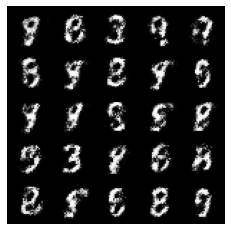

Epoch: 36/200 Steps:469	Epoch_Run_Time: 36.910024	Loss_D : 0.094387	Loss_G : 4.251752	


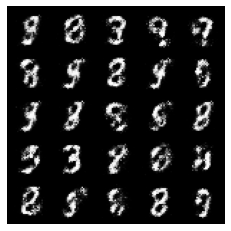

Epoch: 37/200 Steps:469	Epoch_Run_Time: 37.440820	Loss_D : 0.166290	Loss_G : 3.890733	


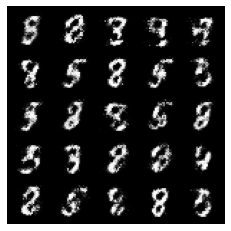

Epoch: 38/200 Steps:469	Epoch_Run_Time: 39.712728	Loss_D : 0.147053	Loss_G : 3.620999	


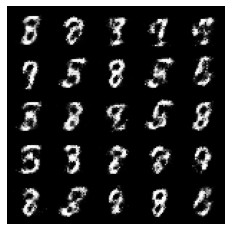

Epoch: 39/200 Steps:469	Epoch_Run_Time: 38.375596	Loss_D : 0.188919	Loss_G : 3.275016	


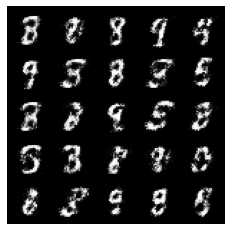

Epoch: 40/200 Steps:469	Epoch_Run_Time: 37.255311	Loss_D : 0.098995	Loss_G : 3.801020	


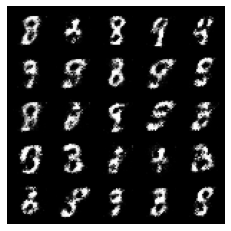

Epoch: 41/200 Steps:469	Epoch_Run_Time: 36.991852	Loss_D : 0.201924	Loss_G : 3.234577	


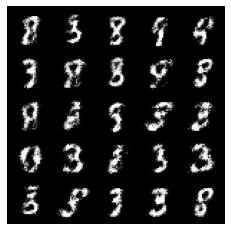

Epoch: 42/200 Steps:469	Epoch_Run_Time: 37.059730	Loss_D : 0.162273	Loss_G : 2.986672	


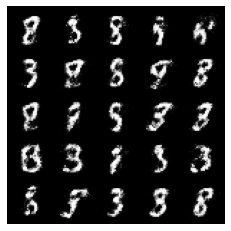

Epoch: 43/200 Steps:469	Epoch_Run_Time: 36.758145	Loss_D : 0.156839	Loss_G : 3.279865	


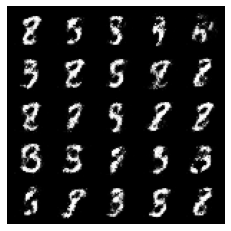

Epoch: 44/200 Steps:469	Epoch_Run_Time: 36.271436	Loss_D : 0.248065	Loss_G : 3.583820	


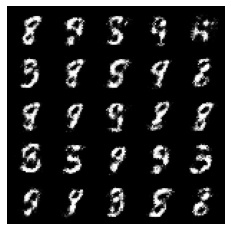

Epoch: 45/200 Steps:469	Epoch_Run_Time: 36.465577	Loss_D : 0.159019	Loss_G : 3.083443	


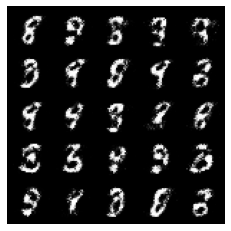

Epoch: 46/200 Steps:469	Epoch_Run_Time: 36.433345	Loss_D : 0.135354	Loss_G : 3.230647	


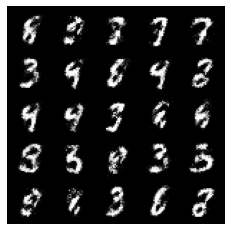

Epoch: 47/200 Steps:469	Epoch_Run_Time: 36.286319	Loss_D : 0.202182	Loss_G : 2.929458	


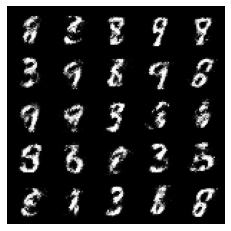

Epoch: 48/200 Steps:469	Epoch_Run_Time: 36.744409	Loss_D : 0.247304	Loss_G : 2.706227	


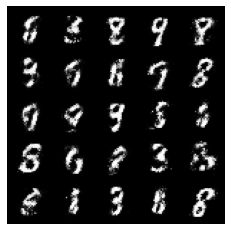

Epoch: 49/200 Steps:469	Epoch_Run_Time: 36.243644	Loss_D : 0.227713	Loss_G : 2.594031	


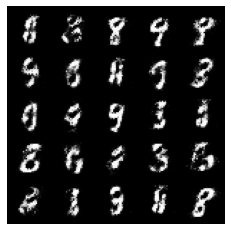

Epoch: 50/200 Steps:469	Epoch_Run_Time: 36.440213	Loss_D : 0.281312	Loss_G : 2.487983	


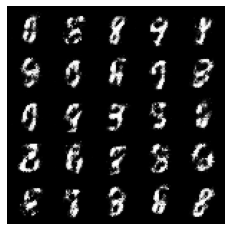

Epoch: 51/200 Steps:469	Epoch_Run_Time: 36.300991	Loss_D : 0.134003	Loss_G : 3.263420	


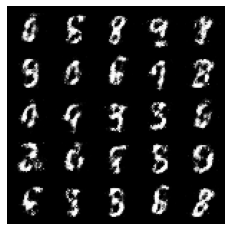

Epoch: 52/200 Steps:469	Epoch_Run_Time: 36.363562	Loss_D : 0.179302	Loss_G : 2.928569	


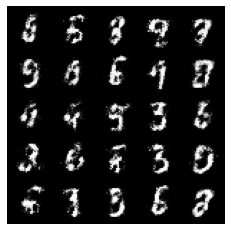

Epoch: 53/200 Steps:469	Epoch_Run_Time: 36.204372	Loss_D : 0.252582	Loss_G : 2.807482	


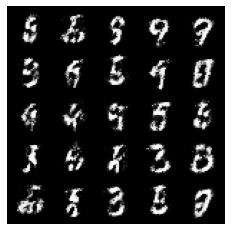

Epoch: 54/200 Steps:469	Epoch_Run_Time: 36.477027	Loss_D : 0.193495	Loss_G : 2.943646	


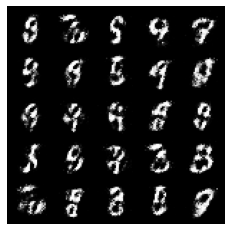

Epoch: 55/200 Steps:469	Epoch_Run_Time: 40.630144	Loss_D : 0.168076	Loss_G : 2.404736	


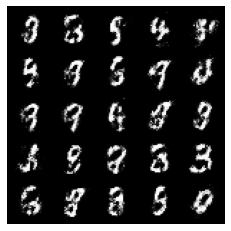

Epoch: 56/200 Steps:469	Epoch_Run_Time: 36.322447	Loss_D : 0.174609	Loss_G : 2.768881	


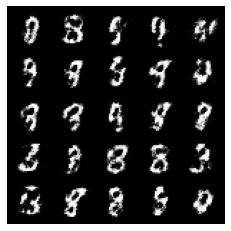

Epoch: 57/200 Steps:469	Epoch_Run_Time: 35.941010	Loss_D : 0.213118	Loss_G : 2.937618	


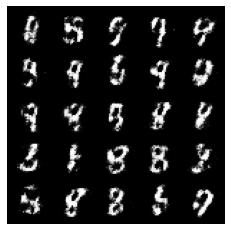

Epoch: 58/200 Steps:469	Epoch_Run_Time: 36.242668	Loss_D : 0.229607	Loss_G : 2.398100	


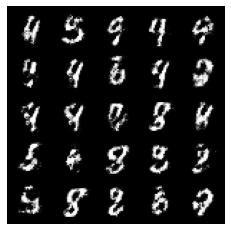

Epoch: 59/200 Steps:469	Epoch_Run_Time: 36.367516	Loss_D : 0.213703	Loss_G : 2.918816	


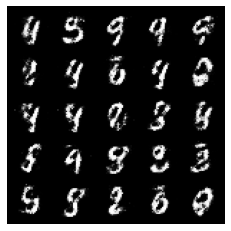

Epoch: 60/200 Steps:469	Epoch_Run_Time: 36.384304	Loss_D : 0.247734	Loss_G : 2.868791	


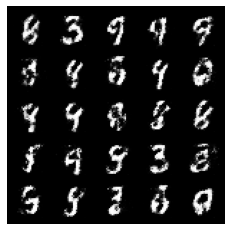

Epoch: 61/200 Steps:469	Epoch_Run_Time: 36.200753	Loss_D : 0.217891	Loss_G : 2.556419	


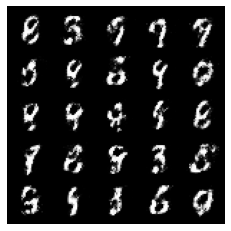

Epoch: 62/200 Steps:469	Epoch_Run_Time: 36.116418	Loss_D : 0.224387	Loss_G : 2.812557	


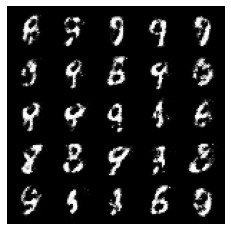

Epoch: 63/200 Steps:469	Epoch_Run_Time: 36.518607	Loss_D : 0.246217	Loss_G : 2.597070	


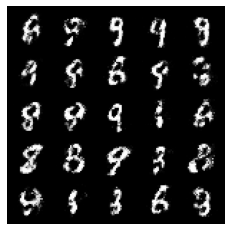

Epoch: 64/200 Steps:469	Epoch_Run_Time: 36.390070	Loss_D : 0.258823	Loss_G : 2.443022	


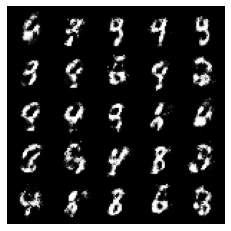

Epoch: 65/200 Steps:469	Epoch_Run_Time: 36.424819	Loss_D : 0.282159	Loss_G : 2.494066	


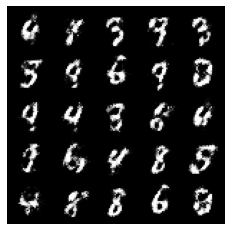

Epoch: 66/200 Steps:469	Epoch_Run_Time: 36.329694	Loss_D : 0.220122	Loss_G : 2.219037	


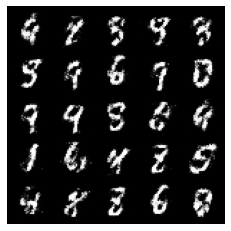

Epoch: 67/200 Steps:469	Epoch_Run_Time: 36.161833	Loss_D : 0.221925	Loss_G : 2.488779	


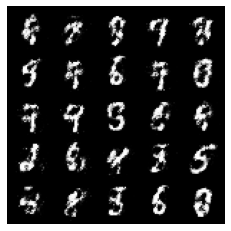

Epoch: 68/200 Steps:469	Epoch_Run_Time: 36.191105	Loss_D : 0.296830	Loss_G : 2.708712	


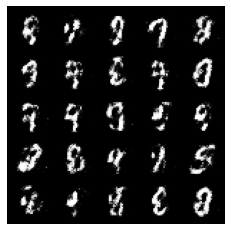

Epoch: 69/200 Steps:469	Epoch_Run_Time: 36.485464	Loss_D : 0.219077	Loss_G : 2.494168	


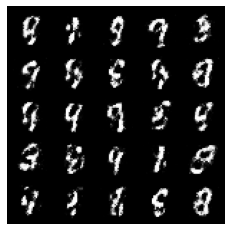

Epoch: 70/200 Steps:469	Epoch_Run_Time: 36.500692	Loss_D : 0.343094	Loss_G : 2.508602	


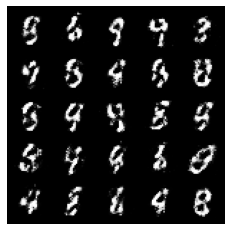

Epoch: 71/200 Steps:469	Epoch_Run_Time: 36.478689	Loss_D : 0.200604	Loss_G : 2.402961	


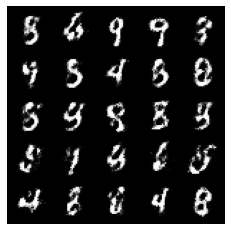

Epoch: 72/200 Steps:469	Epoch_Run_Time: 36.776207	Loss_D : 0.254129	Loss_G : 2.423297	


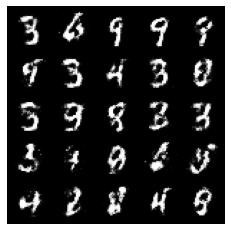

Epoch: 73/200 Steps:469	Epoch_Run_Time: 36.270730	Loss_D : 0.198140	Loss_G : 2.495856	


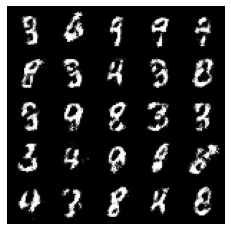

Epoch: 74/200 Steps:469	Epoch_Run_Time: 36.463938	Loss_D : 0.334861	Loss_G : 2.632590	


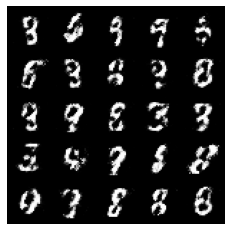

Epoch: 75/200 Steps:469	Epoch_Run_Time: 36.441110	Loss_D : 0.256717	Loss_G : 2.449665	


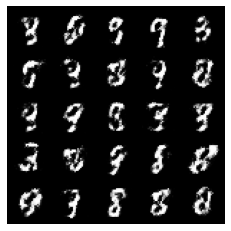

Epoch: 76/200 Steps:469	Epoch_Run_Time: 36.260400	Loss_D : 0.255622	Loss_G : 1.961377	


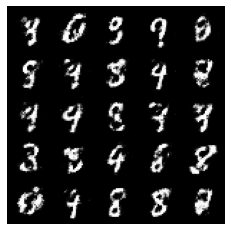

Epoch: 77/200 Steps:469	Epoch_Run_Time: 36.516632	Loss_D : 0.266610	Loss_G : 2.459516	


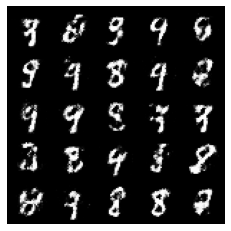

Epoch: 78/200 Steps:469	Epoch_Run_Time: 36.249374	Loss_D : 0.324639	Loss_G : 2.372278	


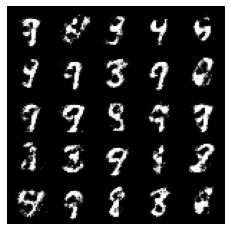

Epoch: 79/200 Steps:469	Epoch_Run_Time: 36.879824	Loss_D : 0.314111	Loss_G : 2.102121	


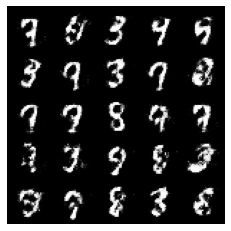

Epoch: 80/200 Steps:469	Epoch_Run_Time: 36.658615	Loss_D : 0.262119	Loss_G : 2.413119	


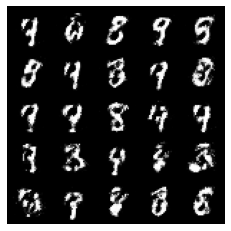

Epoch: 81/200 Steps:469	Epoch_Run_Time: 36.414231	Loss_D : 0.305880	Loss_G : 2.008538	


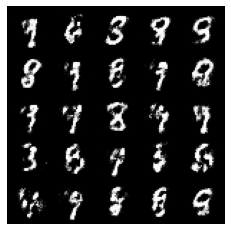

Epoch: 82/200 Steps:469	Epoch_Run_Time: 36.555180	Loss_D : 0.260502	Loss_G : 2.390214	


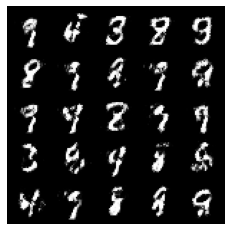

Epoch: 83/200 Steps:469	Epoch_Run_Time: 36.508711	Loss_D : 0.286086	Loss_G : 2.146835	


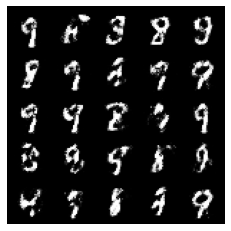

Epoch: 84/200 Steps:469	Epoch_Run_Time: 36.492679	Loss_D : 0.236689	Loss_G : 2.352437	


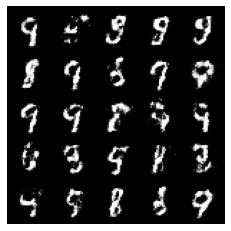

Epoch: 85/200 Steps:469	Epoch_Run_Time: 36.525595	Loss_D : 0.455837	Loss_G : 2.183945	


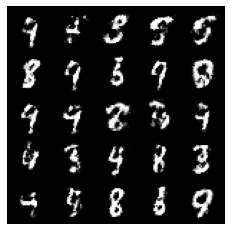

Epoch: 86/200 Steps:469	Epoch_Run_Time: 36.527178	Loss_D : 0.328781	Loss_G : 2.096124	


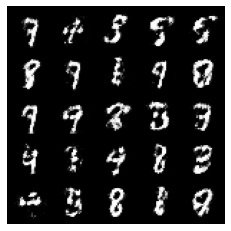

Epoch: 87/200 Steps:469	Epoch_Run_Time: 36.450276	Loss_D : 0.388686	Loss_G : 1.830362	


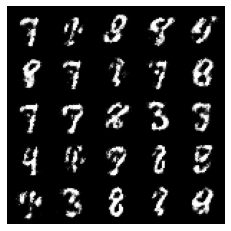

Epoch: 88/200 Steps:469	Epoch_Run_Time: 36.008124	Loss_D : 0.348867	Loss_G : 2.088915	


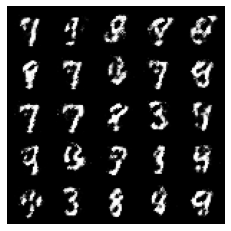

Epoch: 89/200 Steps:469	Epoch_Run_Time: 36.263762	Loss_D : 0.411021	Loss_G : 2.092984	


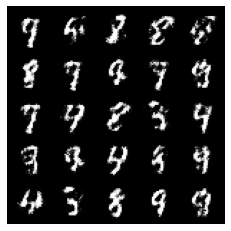

Epoch: 90/200 Steps:469	Epoch_Run_Time: 36.573741	Loss_D : 0.328333	Loss_G : 2.099320	


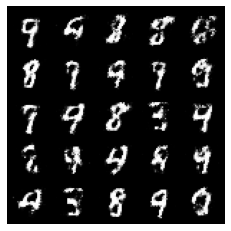

Epoch: 91/200 Steps:469	Epoch_Run_Time: 36.405450	Loss_D : 0.291066	Loss_G : 2.176234	


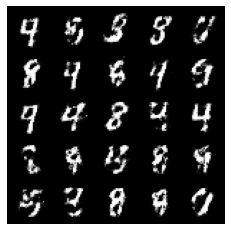

Epoch: 92/200 Steps:469	Epoch_Run_Time: 36.559963	Loss_D : 0.304139	Loss_G : 1.951701	


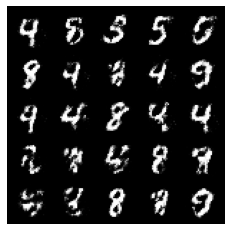

Epoch: 93/200 Steps:469	Epoch_Run_Time: 35.794155	Loss_D : 0.265794	Loss_G : 2.037273	


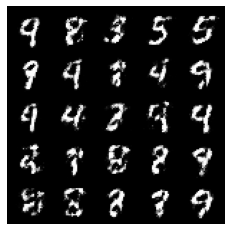

Epoch: 94/200 Steps:469	Epoch_Run_Time: 36.465897	Loss_D : 0.337366	Loss_G : 2.120667	


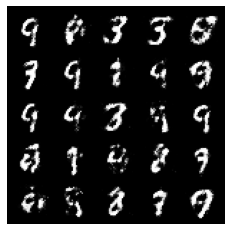

Epoch: 95/200 Steps:469	Epoch_Run_Time: 36.944350	Loss_D : 0.287794	Loss_G : 2.057959	


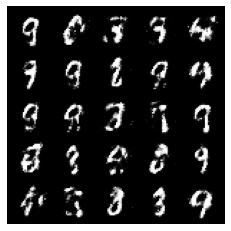

Epoch: 96/200 Steps:469	Epoch_Run_Time: 36.959024	Loss_D : 0.325713	Loss_G : 1.795350	


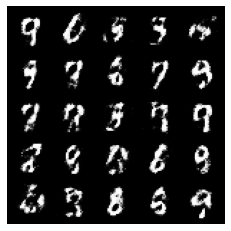

Epoch: 97/200 Steps:469	Epoch_Run_Time: 37.004102	Loss_D : 0.391326	Loss_G : 1.914133	


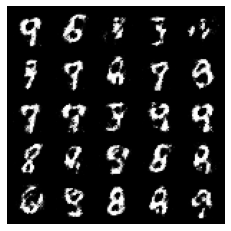

Epoch: 98/200 Steps:469	Epoch_Run_Time: 36.743902	Loss_D : 0.342705	Loss_G : 1.720391	


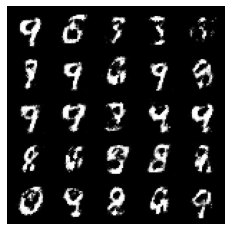

Epoch: 99/200 Steps:469	Epoch_Run_Time: 36.924715	Loss_D : 0.316227	Loss_G : 1.881866	


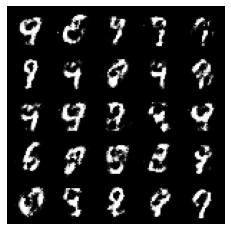

Epoch: 100/200 Steps:469	Epoch_Run_Time: 36.984140	Loss_D : 0.431372	Loss_G : 1.776326	


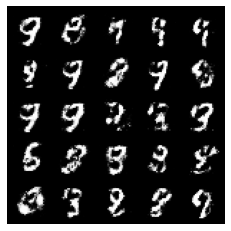

Epoch: 101/200 Steps:469	Epoch_Run_Time: 36.946007	Loss_D : 0.434499	Loss_G : 1.749565	


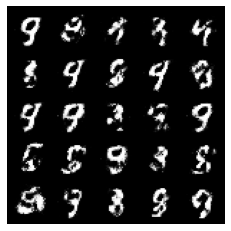

Epoch: 102/200 Steps:469	Epoch_Run_Time: 36.605948	Loss_D : 0.381455	Loss_G : 1.950411	


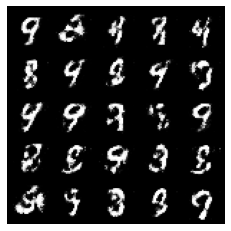

Epoch: 103/200 Steps:469	Epoch_Run_Time: 36.951475	Loss_D : 0.462142	Loss_G : 1.722207	


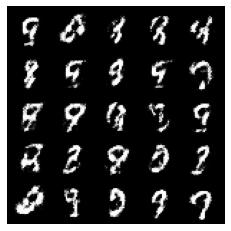

Epoch: 104/200 Steps:469	Epoch_Run_Time: 37.007500	Loss_D : 0.366647	Loss_G : 1.936928	


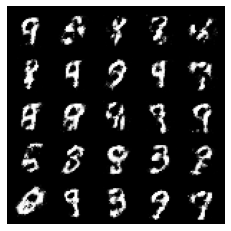

Epoch: 105/200 Steps:469	Epoch_Run_Time: 37.134225	Loss_D : 0.399271	Loss_G : 1.923494	


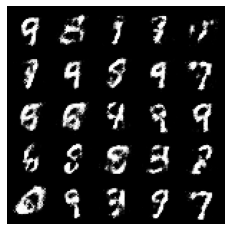

Epoch: 106/200 Steps:469	Epoch_Run_Time: 37.033231	Loss_D : 0.310741	Loss_G : 2.021028	


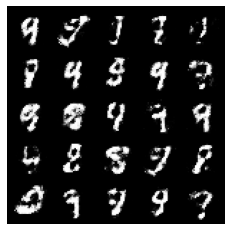

Epoch: 107/200 Steps:469	Epoch_Run_Time: 37.323170	Loss_D : 0.382455	Loss_G : 2.194343	


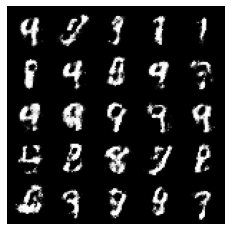

Epoch: 108/200 Steps:469	Epoch_Run_Time: 36.855636	Loss_D : 0.338480	Loss_G : 1.966792	


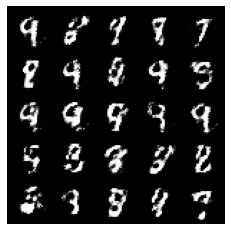

Epoch: 109/200 Steps:469	Epoch_Run_Time: 36.787768	Loss_D : 0.369242	Loss_G : 1.696836	


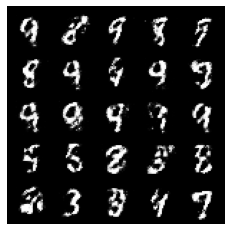

Epoch: 110/200 Steps:469	Epoch_Run_Time: 37.090031	Loss_D : 0.337689	Loss_G : 1.784917	


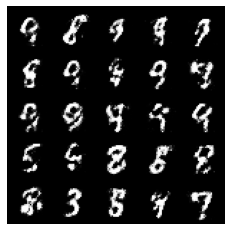

Epoch: 111/200 Steps:469	Epoch_Run_Time: 37.199679	Loss_D : 0.338171	Loss_G : 1.696788	


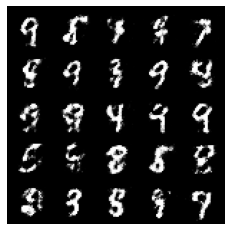

Epoch: 112/200 Steps:469	Epoch_Run_Time: 36.896345	Loss_D : 0.460437	Loss_G : 1.655793	


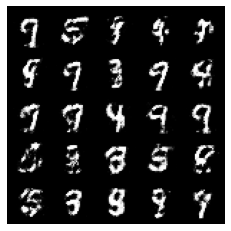

Epoch: 113/200 Steps:469	Epoch_Run_Time: 36.846015	Loss_D : 0.416097	Loss_G : 1.967041	


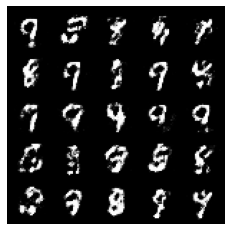

Epoch: 114/200 Steps:469	Epoch_Run_Time: 37.060341	Loss_D : 0.403331	Loss_G : 1.593072	


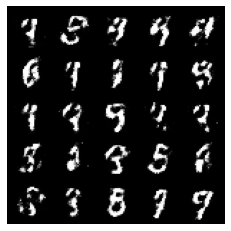

Epoch: 115/200 Steps:469	Epoch_Run_Time: 37.275833	Loss_D : 0.393850	Loss_G : 1.885869	


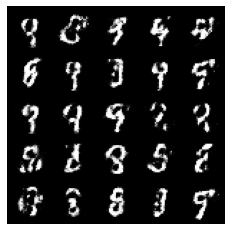

Epoch: 116/200 Steps:469	Epoch_Run_Time: 36.984491	Loss_D : 0.307753	Loss_G : 1.919084	


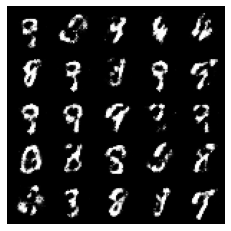

Epoch: 117/200 Steps:469	Epoch_Run_Time: 38.374271	Loss_D : 0.349477	Loss_G : 1.685923	


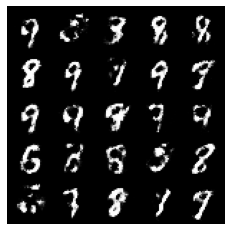

Epoch: 118/200 Steps:469	Epoch_Run_Time: 38.542146	Loss_D : 0.337281	Loss_G : 1.820303	


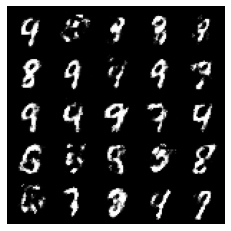

Epoch: 119/200 Steps:469	Epoch_Run_Time: 38.719366	Loss_D : 0.362671	Loss_G : 1.694240	


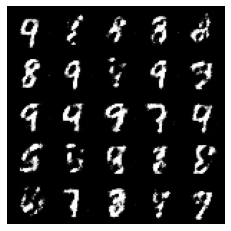

Epoch: 120/200 Steps:469	Epoch_Run_Time: 38.745165	Loss_D : 0.405728	Loss_G : 1.543565	


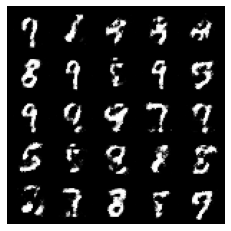

Epoch: 121/200 Steps:469	Epoch_Run_Time: 38.533279	Loss_D : 0.383053	Loss_G : 1.675001	


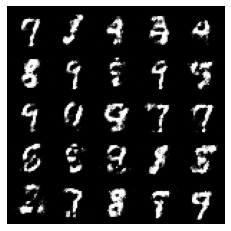

Epoch: 122/200 Steps:469	Epoch_Run_Time: 38.266818	Loss_D : 0.337016	Loss_G : 1.598668	


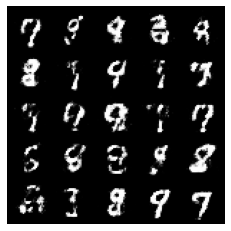

Epoch: 123/200 Steps:469	Epoch_Run_Time: 38.404055	Loss_D : 0.302003	Loss_G : 1.890372	


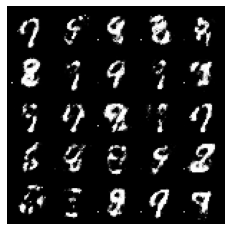

Epoch: 124/200 Steps:469	Epoch_Run_Time: 38.521187	Loss_D : 0.387364	Loss_G : 1.714864	


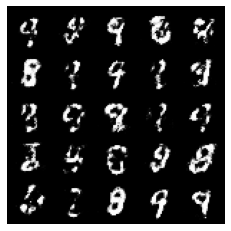

Epoch: 125/200 Steps:469	Epoch_Run_Time: 38.771234	Loss_D : 0.294341	Loss_G : 1.645980	


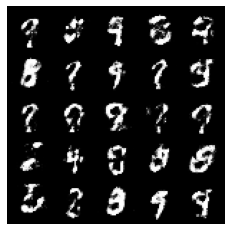

Epoch: 126/200 Steps:469	Epoch_Run_Time: 38.462126	Loss_D : 0.422962	Loss_G : 1.633777	


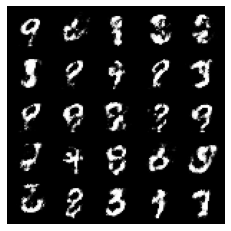

Epoch: 127/200 Steps:469	Epoch_Run_Time: 38.628884	Loss_D : 0.405497	Loss_G : 1.867045	


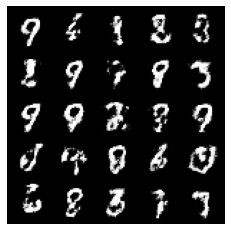

Epoch: 128/200 Steps:469	Epoch_Run_Time: 38.294317	Loss_D : 0.348579	Loss_G : 1.769640	


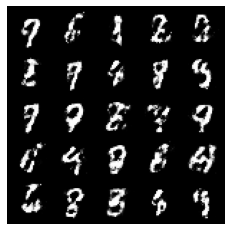

Epoch: 129/200 Steps:469	Epoch_Run_Time: 38.374387	Loss_D : 0.353015	Loss_G : 1.645652	


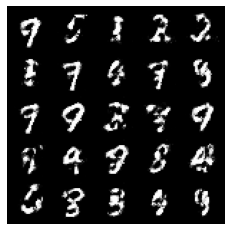

Epoch: 130/200 Steps:469	Epoch_Run_Time: 38.461337	Loss_D : 0.358638	Loss_G : 1.734453	


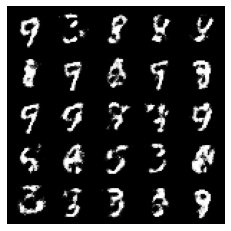

Epoch: 131/200 Steps:469	Epoch_Run_Time: 38.432542	Loss_D : 0.434310	Loss_G : 1.699993	


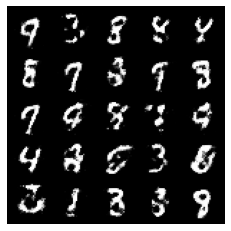

Epoch: 132/200 Steps:469	Epoch_Run_Time: 38.108032	Loss_D : 0.404821	Loss_G : 1.562478	


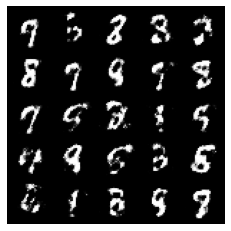

Epoch: 133/200 Steps:469	Epoch_Run_Time: 38.641831	Loss_D : 0.373924	Loss_G : 1.499667	


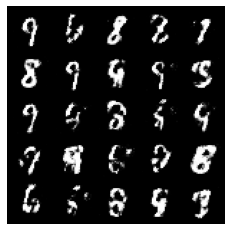

Epoch: 134/200 Steps:469	Epoch_Run_Time: 42.190970	Loss_D : 0.358289	Loss_G : 1.729862	


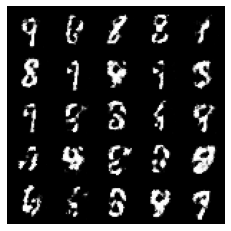

Epoch: 135/200 Steps:469	Epoch_Run_Time: 38.715120	Loss_D : 0.393494	Loss_G : 1.507181	


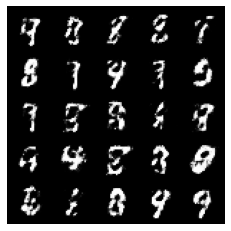

Epoch: 136/200 Steps:469	Epoch_Run_Time: 38.783022	Loss_D : 0.384950	Loss_G : 1.863740	


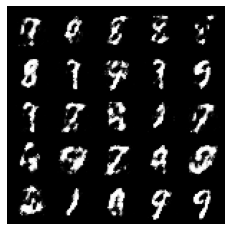

Epoch: 137/200 Steps:469	Epoch_Run_Time: 38.583133	Loss_D : 0.370670	Loss_G : 1.708700	


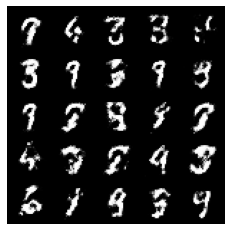

Epoch: 138/200 Steps:469	Epoch_Run_Time: 38.459973	Loss_D : 0.373957	Loss_G : 1.735896	


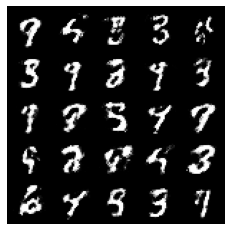

Epoch: 139/200 Steps:469	Epoch_Run_Time: 38.532284	Loss_D : 0.361160	Loss_G : 2.005129	


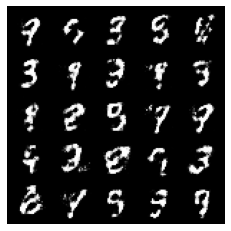

Epoch: 140/200 Steps:469	Epoch_Run_Time: 38.655128	Loss_D : 0.424802	Loss_G : 1.545643	


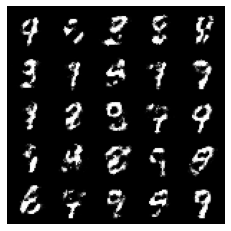

Epoch: 141/200 Steps:469	Epoch_Run_Time: 38.443354	Loss_D : 0.381107	Loss_G : 1.706274	


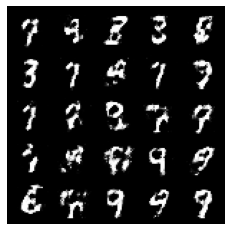

Epoch: 142/200 Steps:469	Epoch_Run_Time: 38.611625	Loss_D : 0.489425	Loss_G : 1.494670	


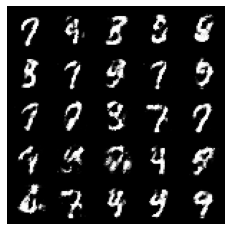

Epoch: 143/200 Steps:469	Epoch_Run_Time: 38.611566	Loss_D : 0.392242	Loss_G : 1.600445	


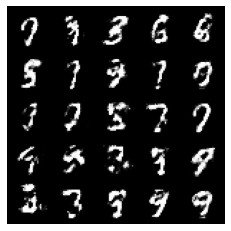

Epoch: 144/200 Steps:469	Epoch_Run_Time: 38.424564	Loss_D : 0.499460	Loss_G : 1.638888	


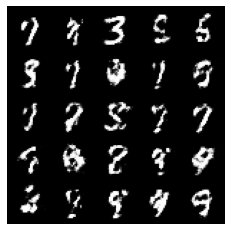

Epoch: 145/200 Steps:469	Epoch_Run_Time: 38.278798	Loss_D : 0.483832	Loss_G : 1.667359	


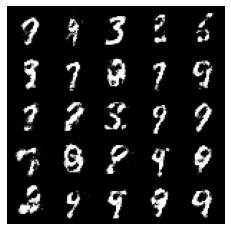

Epoch: 146/200 Steps:469	Epoch_Run_Time: 38.590044	Loss_D : 0.416432	Loss_G : 1.512319	


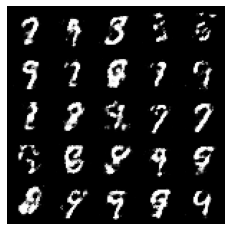

Epoch: 147/200 Steps:469	Epoch_Run_Time: 38.331350	Loss_D : 0.403942	Loss_G : 1.836293	


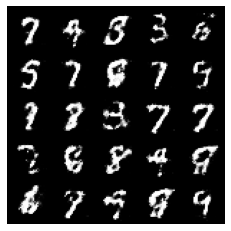

Epoch: 148/200 Steps:469	Epoch_Run_Time: 38.689491	Loss_D : 0.381866	Loss_G : 1.723592	


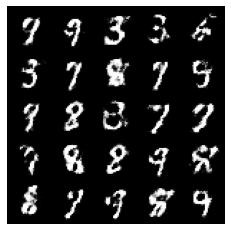

Epoch: 149/200 Steps:469	Epoch_Run_Time: 38.393285	Loss_D : 0.382774	Loss_G : 1.587805	


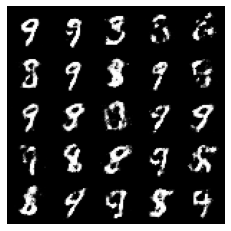

Epoch: 150/200 Steps:469	Epoch_Run_Time: 43.488245	Loss_D : 0.419153	Loss_G : 1.498013	


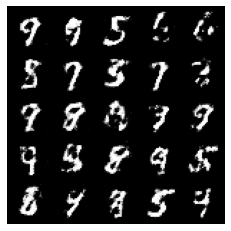

Epoch: 151/200 Steps:469	Epoch_Run_Time: 38.285529	Loss_D : 0.423484	Loss_G : 1.680486	


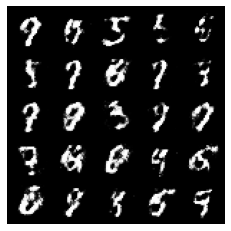

Epoch: 152/200 Steps:469	Epoch_Run_Time: 38.358446	Loss_D : 0.438089	Loss_G : 1.436139	


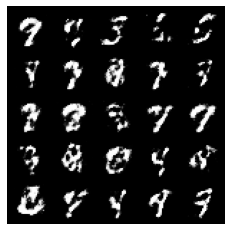

Epoch: 153/200 Steps:469	Epoch_Run_Time: 38.714675	Loss_D : 0.402604	Loss_G : 1.543820	


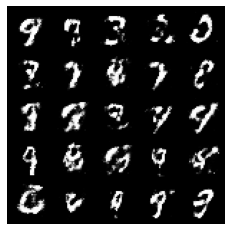

Epoch: 154/200 Steps:469	Epoch_Run_Time: 38.311685	Loss_D : 0.375070	Loss_G : 1.602976	


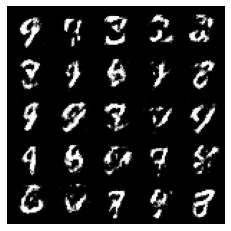

Epoch: 155/200 Steps:469	Epoch_Run_Time: 38.556910	Loss_D : 0.495574	Loss_G : 1.395389	


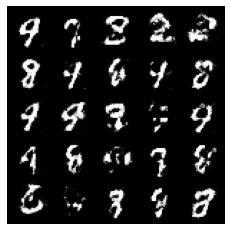

Epoch: 156/200 Steps:469	Epoch_Run_Time: 38.359380	Loss_D : 0.397209	Loss_G : 1.520803	


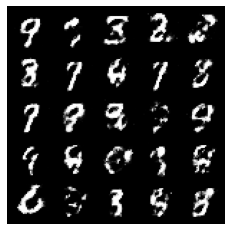

Epoch: 157/200 Steps:469	Epoch_Run_Time: 38.834651	Loss_D : 0.428425	Loss_G : 1.298862	


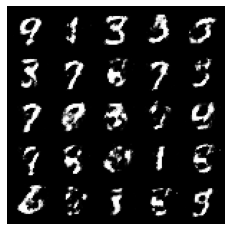

Epoch: 158/200 Steps:469	Epoch_Run_Time: 38.469321	Loss_D : 0.481915	Loss_G : 1.251508	


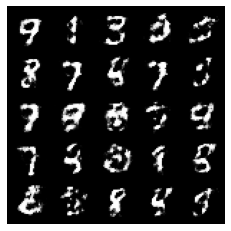

Epoch: 159/200 Steps:469	Epoch_Run_Time: 38.954925	Loss_D : 0.414146	Loss_G : 1.404482	


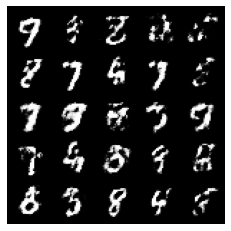

Epoch: 160/200 Steps:469	Epoch_Run_Time: 38.641346	Loss_D : 0.416728	Loss_G : 1.402775	


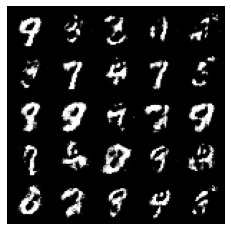

Epoch: 161/200 Steps:469	Epoch_Run_Time: 38.687701	Loss_D : 0.419995	Loss_G : 1.341221	


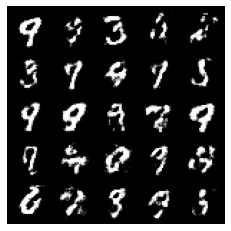

Epoch: 162/200 Steps:469	Epoch_Run_Time: 38.857202	Loss_D : 0.426947	Loss_G : 1.386551	


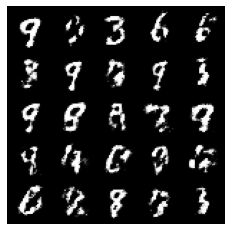

Epoch: 163/200 Steps:469	Epoch_Run_Time: 39.029397	Loss_D : 0.371177	Loss_G : 1.517072	


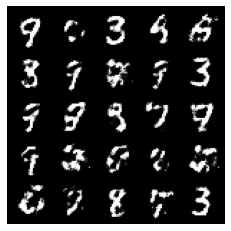

Epoch: 164/200 Steps:469	Epoch_Run_Time: 38.888503	Loss_D : 0.406630	Loss_G : 1.545082	


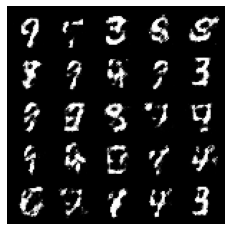

Epoch: 165/200 Steps:469	Epoch_Run_Time: 38.803876	Loss_D : 0.502241	Loss_G : 1.398626	


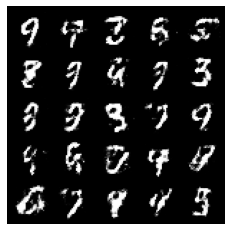

Epoch: 166/200 Steps:469	Epoch_Run_Time: 38.739587	Loss_D : 0.388470	Loss_G : 1.473062	


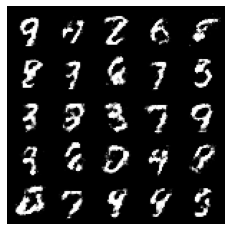

Epoch: 167/200 Steps:469	Epoch_Run_Time: 39.330334	Loss_D : 0.397211	Loss_G : 1.586602	


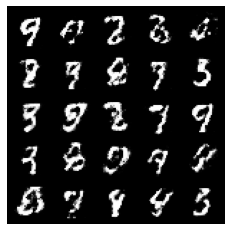

Epoch: 168/200 Steps:469	Epoch_Run_Time: 38.956341	Loss_D : 0.416367	Loss_G : 1.321447	


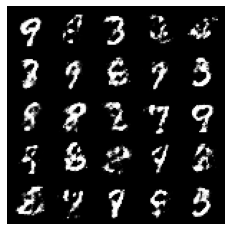

Epoch: 169/200 Steps:469	Epoch_Run_Time: 38.940397	Loss_D : 0.444367	Loss_G : 1.299438	


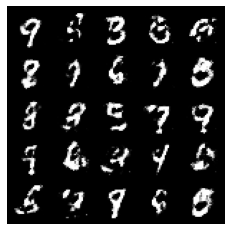

Epoch: 170/200 Steps:469	Epoch_Run_Time: 39.219552	Loss_D : 0.512465	Loss_G : 1.457759	


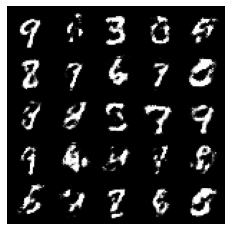

Epoch: 171/200 Steps:469	Epoch_Run_Time: 38.963423	Loss_D : 0.487228	Loss_G : 1.218660	


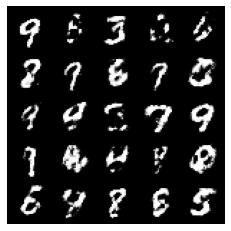

Epoch: 172/200 Steps:469	Epoch_Run_Time: 39.175086	Loss_D : 0.465162	Loss_G : 1.415770	


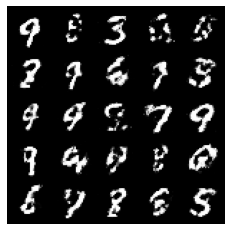

Epoch: 173/200 Steps:469	Epoch_Run_Time: 38.954022	Loss_D : 0.485348	Loss_G : 1.253795	


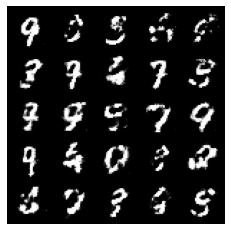

Epoch: 174/200 Steps:469	Epoch_Run_Time: 38.897771	Loss_D : 0.488079	Loss_G : 1.355417	


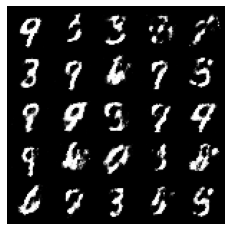

Epoch: 175/200 Steps:469	Epoch_Run_Time: 38.982067	Loss_D : 0.426029	Loss_G : 1.231787	


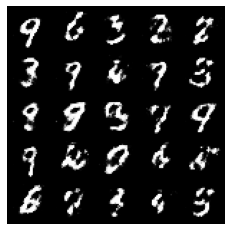

Epoch: 176/200 Steps:469	Epoch_Run_Time: 38.963067	Loss_D : 0.456453	Loss_G : 1.475881	


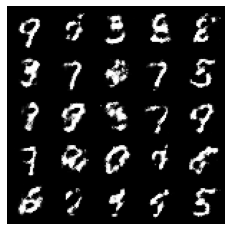

Epoch: 177/200 Steps:469	Epoch_Run_Time: 38.892074	Loss_D : 0.583764	Loss_G : 1.179818	


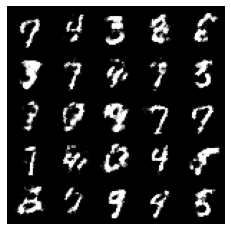

Epoch: 178/200 Steps:469	Epoch_Run_Time: 39.304765	Loss_D : 0.461391	Loss_G : 1.243559	


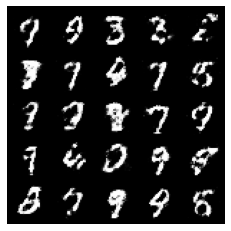

Epoch: 179/200 Steps:469	Epoch_Run_Time: 38.844909	Loss_D : 0.555012	Loss_G : 1.376389	


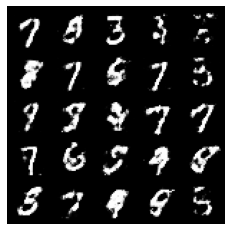

Epoch: 180/200 Steps:469	Epoch_Run_Time: 40.374238	Loss_D : 0.456119	Loss_G : 1.215836	


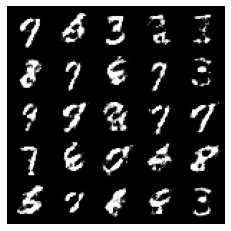

Epoch: 181/200 Steps:469	Epoch_Run_Time: 41.414992	Loss_D : 0.519078	Loss_G : 1.276137	


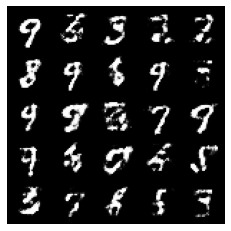

Epoch: 182/200 Steps:469	Epoch_Run_Time: 38.948198	Loss_D : 0.441275	Loss_G : 1.475748	


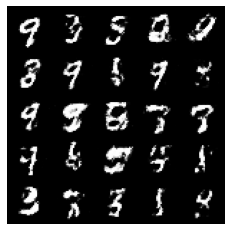

Epoch: 183/200 Steps:469	Epoch_Run_Time: 38.949607	Loss_D : 0.443802	Loss_G : 1.375489	


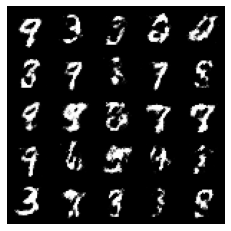

Epoch: 184/200 Steps:469	Epoch_Run_Time: 39.255562	Loss_D : 0.471003	Loss_G : 1.396793	


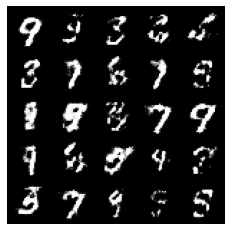

Epoch: 185/200 Steps:469	Epoch_Run_Time: 38.851356	Loss_D : 0.561123	Loss_G : 1.257416	


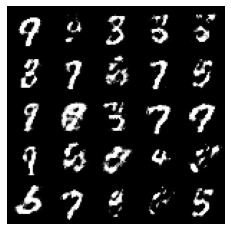

Epoch: 186/200 Steps:469	Epoch_Run_Time: 39.101727	Loss_D : 0.500524	Loss_G : 1.242594	


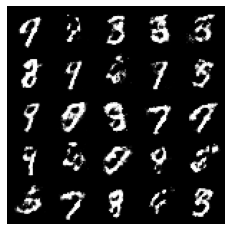

Epoch: 187/200 Steps:469	Epoch_Run_Time: 38.940601	Loss_D : 0.507345	Loss_G : 1.084554	


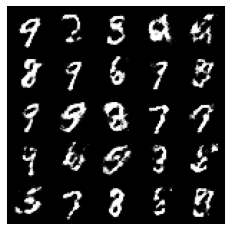

Epoch: 188/200 Steps:469	Epoch_Run_Time: 38.951081	Loss_D : 0.512740	Loss_G : 1.225484	


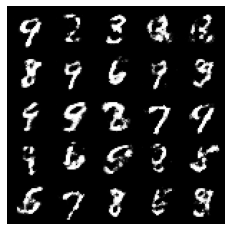

Epoch: 189/200 Steps:469	Epoch_Run_Time: 39.026318	Loss_D : 0.479241	Loss_G : 1.363260	


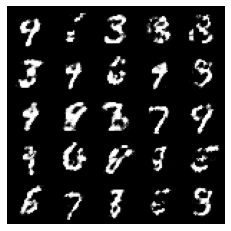

Epoch: 190/200 Steps:469	Epoch_Run_Time: 39.002369	Loss_D : 0.581961	Loss_G : 1.186793	


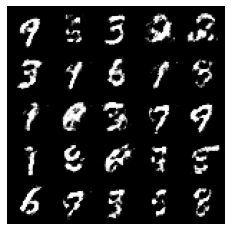

Epoch: 191/200 Steps:469	Epoch_Run_Time: 39.236856	Loss_D : 0.520510	Loss_G : 1.104980	


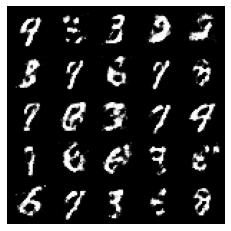

Epoch: 192/200 Steps:469	Epoch_Run_Time: 39.124407	Loss_D : 0.479464	Loss_G : 1.190050	


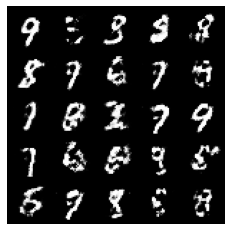

Epoch: 193/200 Steps:469	Epoch_Run_Time: 39.261463	Loss_D : 0.515039	Loss_G : 1.325408	


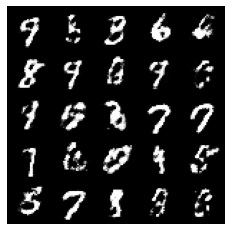

Epoch: 194/200 Steps:469	Epoch_Run_Time: 38.899113	Loss_D : 0.464949	Loss_G : 1.174755	


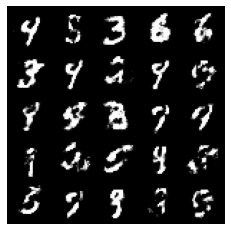

Epoch: 195/200 Steps:469	Epoch_Run_Time: 39.109799	Loss_D : 0.504815	Loss_G : 1.120731	


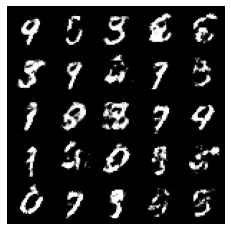

Epoch: 196/200 Steps:469	Epoch_Run_Time: 43.670082	Loss_D : 0.515720	Loss_G : 1.259056	


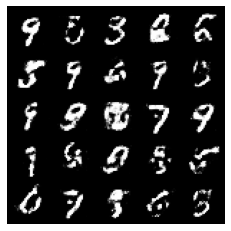

Epoch: 197/200 Steps:469	Epoch_Run_Time: 38.957845	Loss_D : 0.512047	Loss_G : 1.157627	


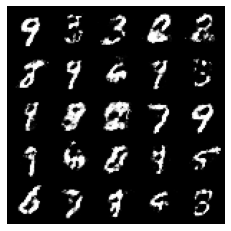

Epoch: 198/200 Steps:469	Epoch_Run_Time: 38.864688	Loss_D : 0.453940	Loss_G : 1.333248	


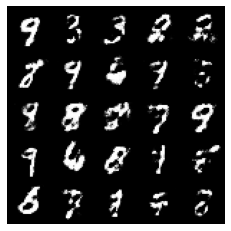

Epoch: 199/200 Steps:469	Epoch_Run_Time: 38.737804	Loss_D : 0.559360	Loss_G : 1.175674	


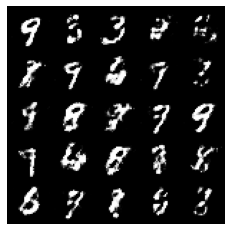

In [10]:
n_epochs = 200
cur_step = 0
mean_generator_loss = 0
total_steps = 0
start_time = time.time()
mean_discriminator_loss = 0
gen_loss = False

G_losses = []
D_losses = []
D_mean_losses = []
G_mean_losses = []


for epoch in range(n_epochs):
    cur_step = 0
    start = time.time()
    for real, _ in dataloader:
        
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ## Update discriminator ##
        disc_opt.zero_grad()
        fake_noise = get_noise(cur_batch_size, z_dim, device=device)
        fake = gen(fake_noise)
        disc_fake_pred = disc(fake.detach())
        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_pred = disc(real)
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2
        
        disc_loss.backward(retain_graph=True)
        disc_opt.step()

        ## Update generator ##
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        disc_fake_pred = disc(fake_2)
        gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        
        gen_loss.backward()
        gen_opt.step()


        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() 

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() 
        
        cur_step += 1
        total_steps += 1
        
        D_losses.append(disc_loss.item())
        G_losses.append(gen_loss.item())
        
        
        print_val = f"Epoch: {epoch}/{n_epochs} Steps:{cur_step}\t"
        print_val += f"Epoch_Run_Time: {(time.time()-start):.6f}\t"
        print_val += f"Loss_D : {disc_loss.item():.6f}\t"
        print_val += f"Loss_G : {gen_loss.item():.6f}\t"  
        print(print_val, end='\r',flush = True)
       
    
    print()
    loss_D_mean = mean_discriminator_loss / cur_step
    loss_G_mean = mean_generator_loss / cur_step
    print_val = f"Epoch: {epoch}/{n_epochs} Total Steps:{total_steps}\t"
    print_val += f"Total_Time : {(time.time() - start_time):.6f}\t"
    print_val += f"Loss_D : {disc_loss.item():.6f}\t"
    print_val += f"Loss_G : {gen_loss.item():.6f}\t"
    print_val += f"Loss_D_Mean : {loss_D_mean:.6f}\t"
    print_val += f"Loss_G_Mean : {loss_G_mean:.6f}\t"
    print(print_val, end='\r',flush = True)
    
    D_mean_losses.append(loss_D_mean)
    G_mean_losses.append(loss_G_mean)
    
    fake_noise = fixed_noise
    fake = gen(fake_noise)
    show_tensor_images(fake, show_fig=True,epoch=epoch)
    mean_generator_loss = 0
    mean_discriminator_loss = 0


# After Tranning Loss Visualization

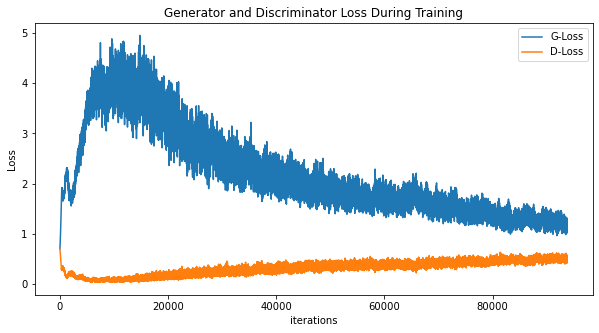

In [11]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G-Loss")
plt.plot(D_losses,label="D-Loss")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

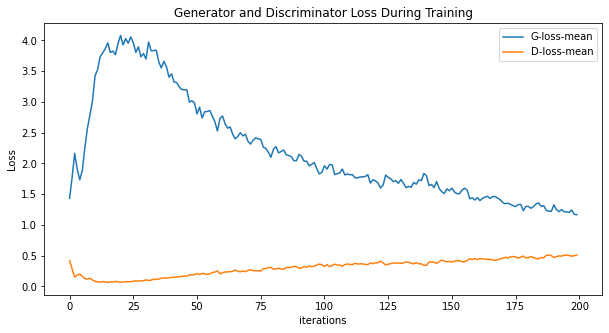

In [12]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_mean_losses,label="G-loss-mean")
plt.plot(D_mean_losses,label="D-loss-mean")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

# Animated GIF Create & Show

  DEPRECATION: tensorflow-docs was installed using the legacy 'setup.py install' method, because a wheel could not be built for it. A possible replacement is to fix the wheel build issue reported above. You can find discussion regarding this at https://github.com/pypa/pip/issues/8368.
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.



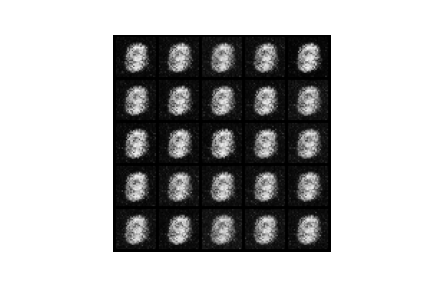

In [13]:
anim_file = 'Vanilla-GAN.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)


!pip install -q git+https://github.com/tensorflow/docs
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

# Testing Vanilla GAN

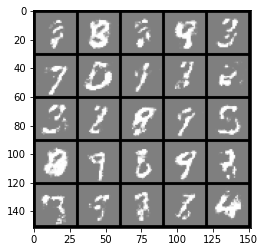

In [64]:
def show_new_gen_images(tensor_img, num_img=25):
    tensor_img = (tensor_img + 1) / 2
    unflat_img = tensor_img.detach().cpu()
    img_grid = make_grid(unflat_img[:num_img], nrow=5)
    plt.imshow(img_grid.permute(1, 2, 0).squeeze(),cmap='gray')
    plt.show()

num_image = 25
noise = get_noise(num_image, z_dim, device=device)
with torch.no_grad():
    fake_img = gen(noise)

show_new_gen_images(fake_img.reshape(num_image,1,28,28))

# Important Resources 


[MNIST Dataset](http://yann.lecun.com/exdb/mnist/)

[Generative Adversarial Networks (Ian J. Goodfellow ..)](https://arxiv.org/abs/1406.2661)

[thispersondoesnotexist](https://www.thispersondoesnotexist.com/)

[Pre-trained Model Exploration](https://colab.research.google.com/github/https-deeplearning-ai/GANs-Public/blob/master/C1W1_(Colab)_Pre_trained_model_exploration.ipynb)

[Inputs to a Pre-trained GAN](https://colab.research.google.com/github/https-deeplearning-ai/GANs-Public/blob/master/C1W1_(Colab)_Inputs_to_a_pre_trained_GAN.ipynb)
